In [176]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Component extraction:

**Method 1**

In [177]:
image = cv2.imread('/content/7 circles.png')
enhanced_image = cv2.medianBlur(image, 5)

In [178]:
gray_image = cv2.cvtColor(enhanced_image, cv2.COLOR_BGR2GRAY)

In [179]:
edges = cv2.Canny(gray_image, 50, 150)

In [180]:
contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

In [181]:
circle_mask = np.zeros_like(edges)
cv2.drawContours(circle_mask, contours, -1, (255), thickness=cv2.FILLED)

array([[  0,   0,   0, ...,   0,   0,   0],
       [  0, 255, 255, ...,   0,   0,   0],
       [  0, 255, 255, ...,   0,   0,   0],
       ...,
       [  0,   0,   0, ..., 255,   0,   0],
       [  0,   0,   0, ..., 255,   0,   0],
       [  0,   0,   0, ..., 255,   0,   0]], dtype=uint8)

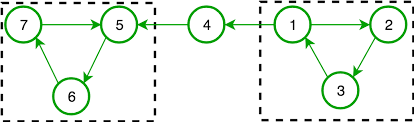

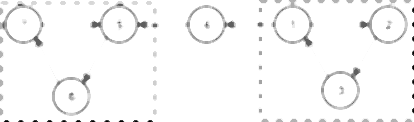

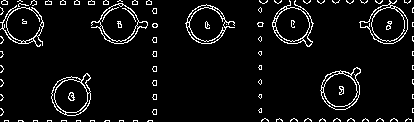

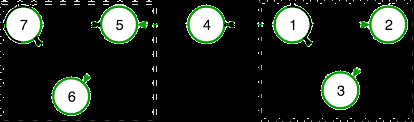

In [182]:
circles_image = cv2.bitwise_and(image, image, mask=circle_mask)
cv2_imshow(image)
cv2_imshow( gray_image)
cv2_imshow( edges)
cv2_imshow(circles_image)


# enhancment of blurry images

In [210]:
image = cv2.imread('/content/butterfly.jpg')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

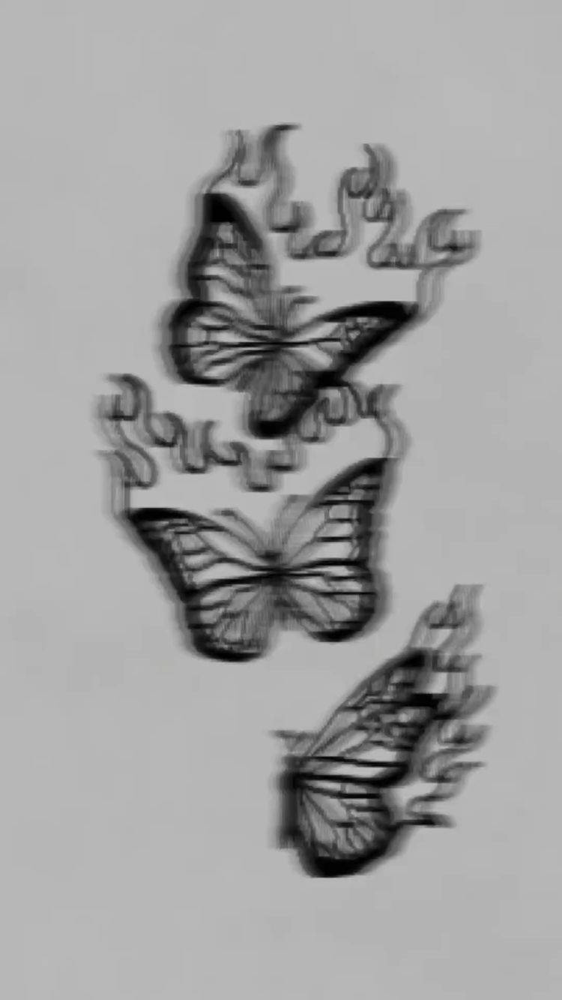

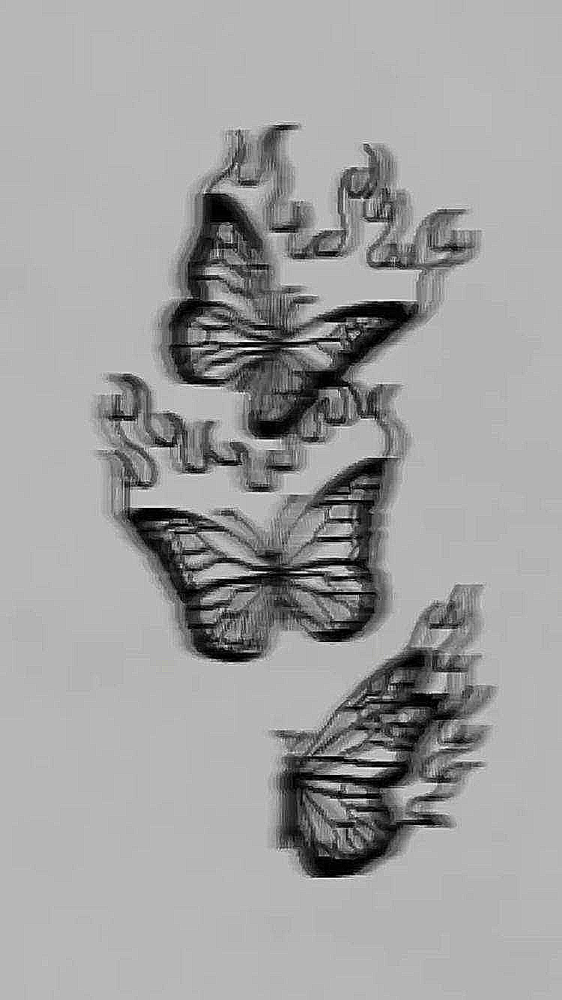

In [211]:
kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
sharpened = cv2.filter2D(image, -1, kernel)
cv2_imshow(image)
cv2_imshow(sharpened)

# Noise removal from blurry images


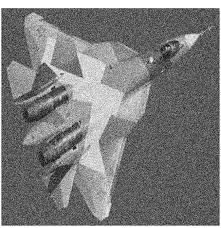

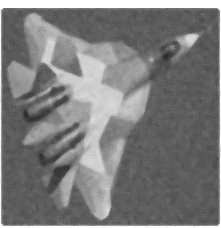

In [185]:
image = cv2.imread('/content/Rocket.jpeg')
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
denoised_image = cv2.medianBlur(gray_image, 5)
cv2_imshow(image)
cv2_imshow( denoised_image)

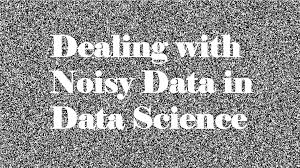

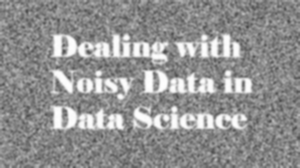

In [186]:
image2 = cv2.imread('/content/Text.jpeg')
denoised_image2 = cv2.GaussianBlur(image2, (5, 5), 0)
cv2_imshow( image2)
cv2_imshow(denoised_image2)

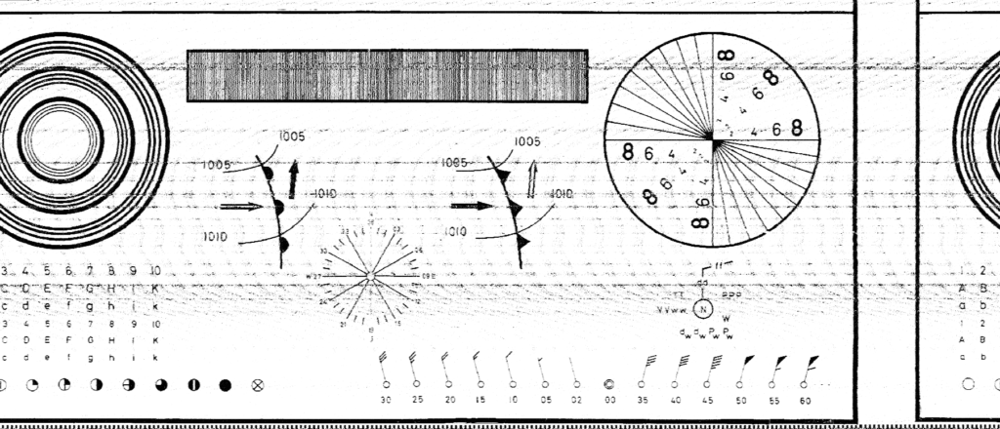

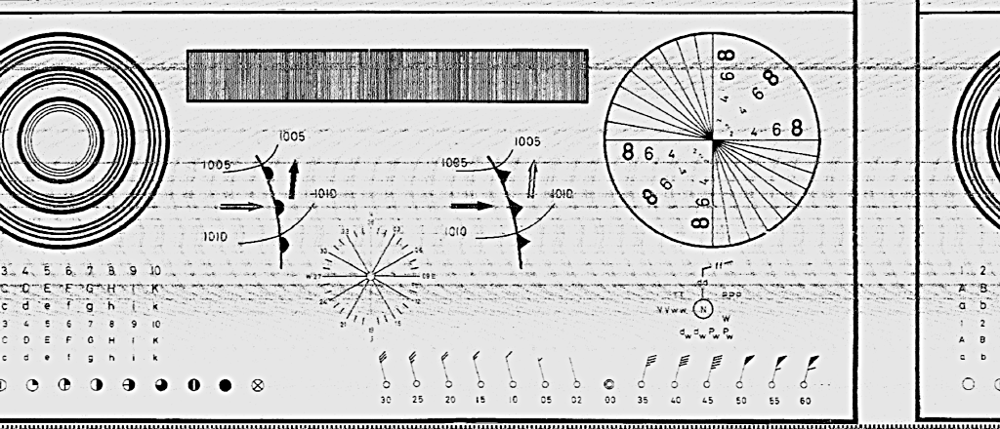

In [187]:
image3 = cv2.imread('/content/Noisy_1.png')
gray3 = cv2.cvtColor(image3, cv2.COLOR_BGR2GRAY)
blurred = cv2.GaussianBlur(gray3, (0, 0), 3)
sharpened = cv2.addWeighted(gray3, 1.5, blurred, -0.6, 0)
cv2_imshow( image3)
cv2_imshow( sharpened)

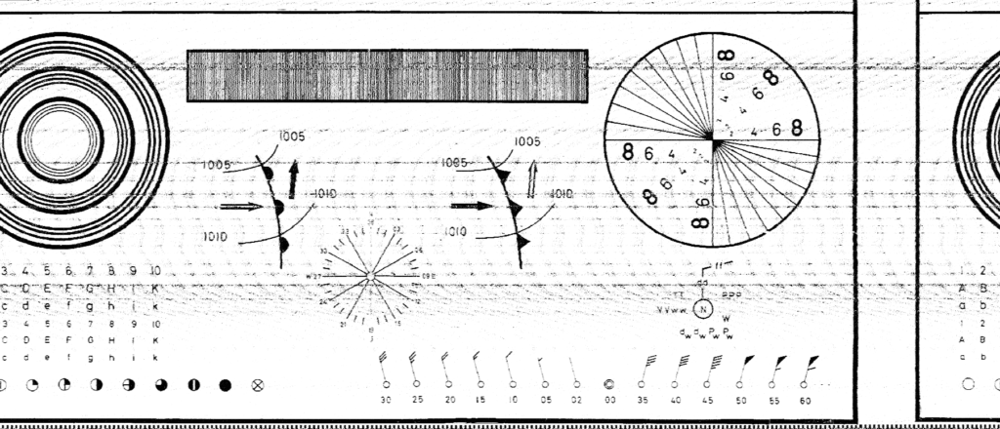

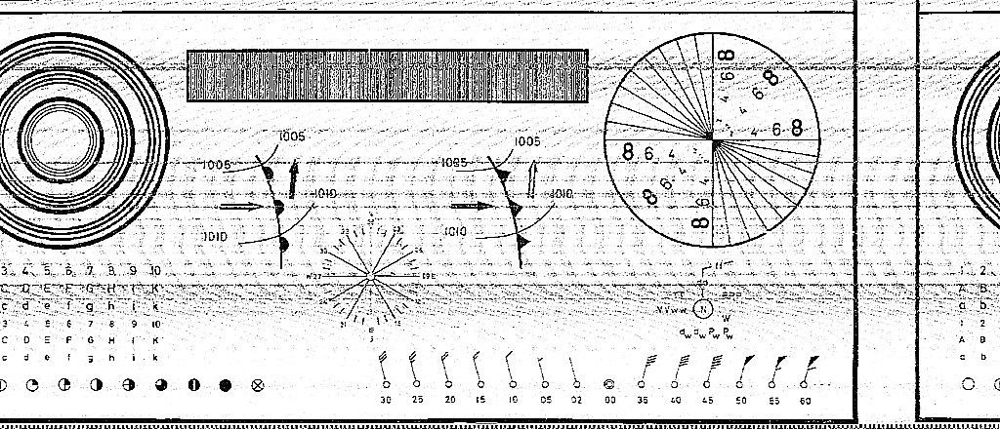

In [188]:
kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
sharpened = cv2.filter2D(image3, -1, kernel)
cv2_imshow(image3)
cv2_imshow(sharpened)

# Visual Enhancment

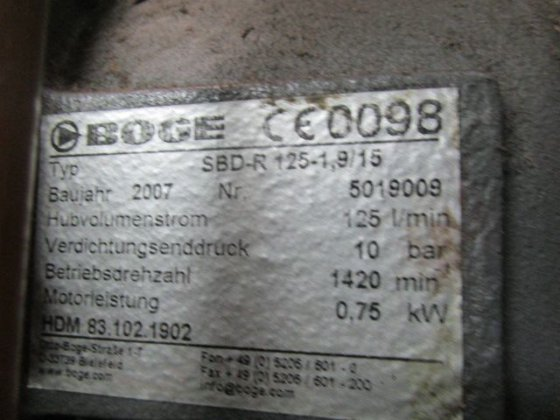

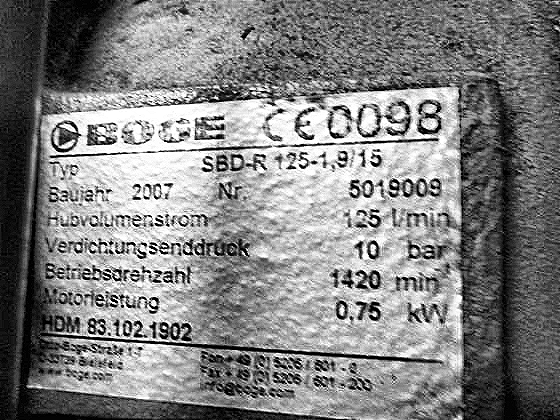

In [189]:
image = cv2.imread('/content/Name plate.jpg')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
equalized = cv2.equalizeHist(gray)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
stretched = clahe.apply(equalized)
kernel = np.array([[0, -1, 0],
                       [-1, 5,-1],
                       [0, -1, 0]])
sharpened = cv2.filter2D(stretched, -1, kernel)
cv2_imshow(image)
cv2_imshow(sharpened)

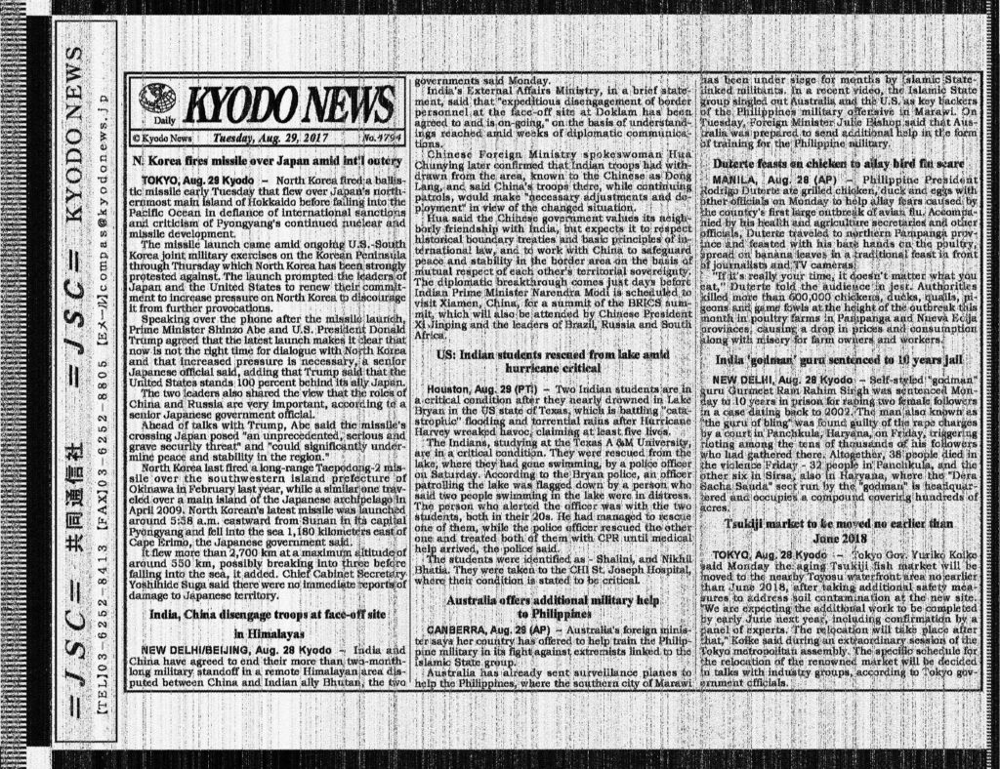

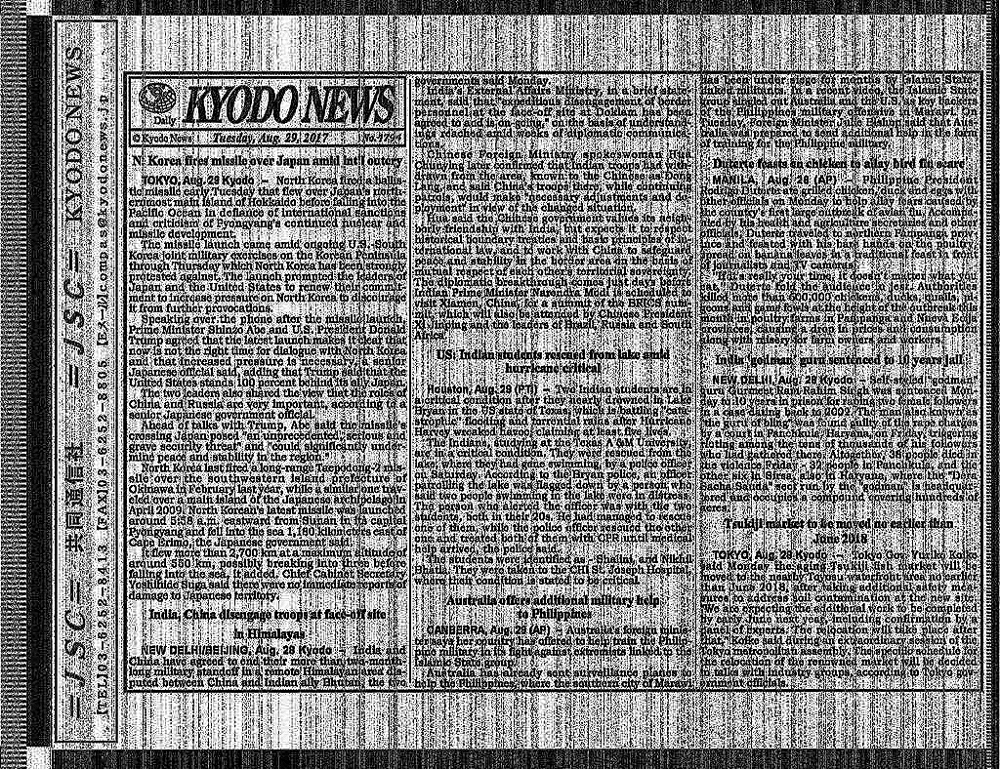

In [190]:
image = cv2.imread('/content/Noisy_2.jpg')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
equalized = cv2.equalizeHist(gray)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
stretched = clahe.apply(equalized)
kernel = np.array([[0, -1, 0],
                       [-1, 5,-1],
                       [0, -1, 0]])
sharpened = cv2.filter2D(stretched, -1, kernel)
cv2_imshow(image)
cv2_imshow(sharpened)

**Method 2**

In [191]:
image = cv2.imread('/content/Name plate.jpg')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
equalized = cv2.equalizeHist(gray)

In [192]:
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
stretched = clahe.apply(equalized)

In [193]:
kernel_sharpen_1 = np.array([[-1, -1, -1],
                                [-1,  9, -1],
                                [-1, -1, -1]])
sharpened_1 = cv2.filter2D(stretched, -1, kernel_sharpen_1)
    
kernel_sharpen_2 = np.array([[ 0, -1,  0],
                                [-1,  5, -1],
                                [ 0, -1,  0]])
sharpened_2 = cv2.filter2D(stretched, -1, kernel_sharpen_2)

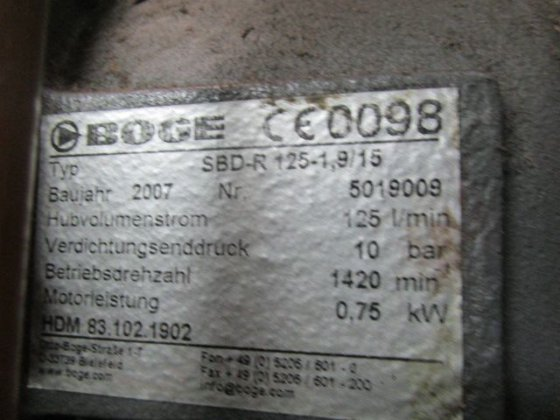

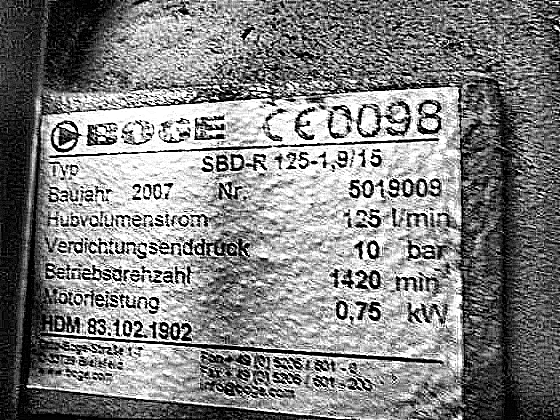

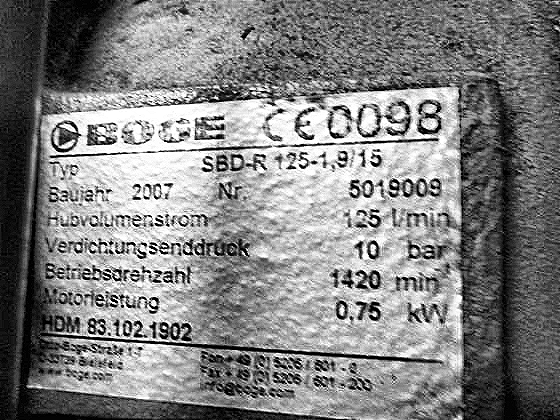

In [194]:
cv2_imshow(image)
cv2_imshow(sharpened_1)
cv2_imshow(sharpened_2)

Method 3

In [195]:
image = cv2.imread('/content/Noisy_2.jpg')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
denoised = cv2.bilateralFilter(gray, 9, 75, 75)

In [196]:
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
equalized = clahe.apply(denoised)

In [197]:
blurred = cv2.GaussianBlur(equalized, (0, 0), 3)
sharpened = cv2.addWeighted(equalized, 1.5, blurred, -0.5, 0)

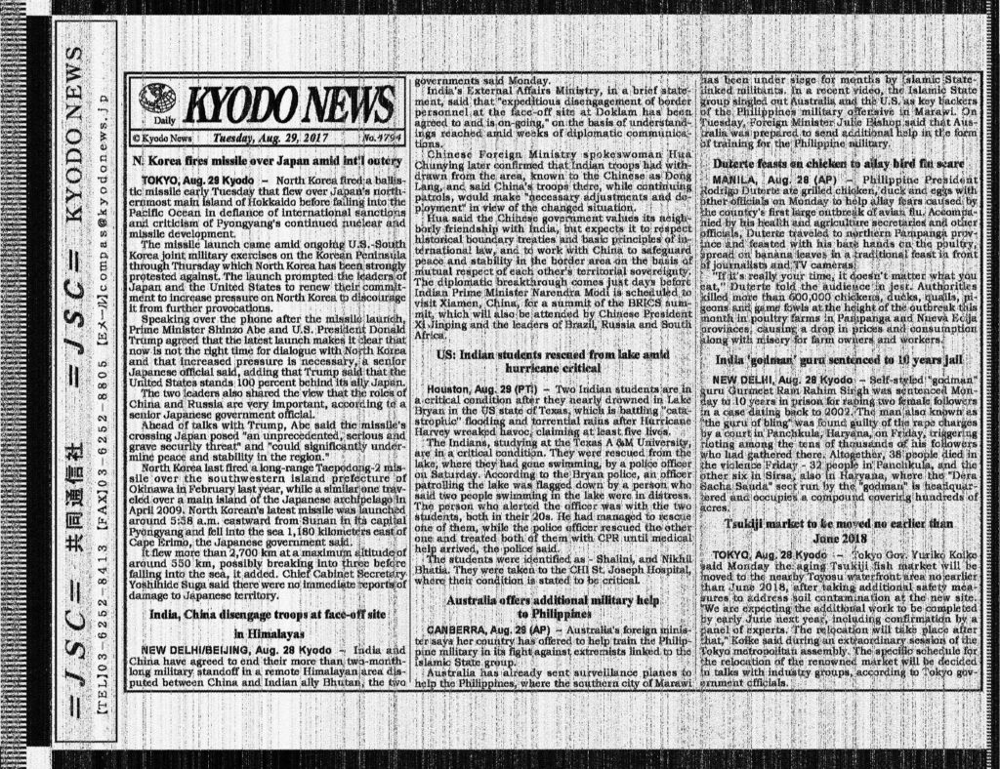

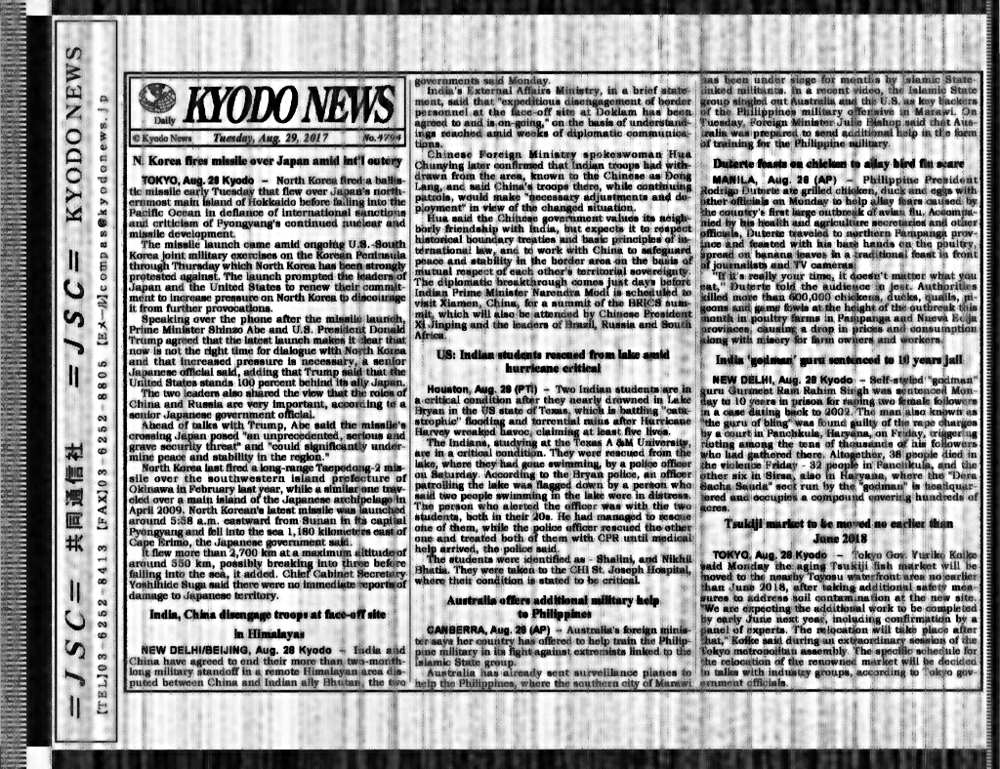

In [198]:
cv2_imshow(image)
cv2_imshow(sharpened)